# Faculdade de Tecnologia de Votorantim

## Curso de Ciência de Dados para Negócios

---

### Integrantes do Grupo

- **Ana Elisa Rubinato Cavalheiro**  
- **Bruno Felipe de Souza Araujo**  
- **Nicole Fava Pires**  
- **Vitória Lisauskas Ferraz da Silva**

---


## **Projeto 6: Análise e Identificação de SPAM em Mensagens**

**Contextualização: Dataset SMS Spam Collection**

O SMS Spam Collection é um conjunto de dados público amplamente utilizado para estudos de
detecção de spam em mensagens de texto (SMS). Ele contém 5.574 mensagens, sendo 4.827
legítimas (ham) e 747 spam, coletadas de fontes como fóruns públicos, bases acadêmicas e
contribuições voluntárias. Esse dataset é relevante porque:

• **Reflete desafios reais:** Mensagens SMS são curtas (até 160 caracteres), contêm abreviações,
erros de digitação e linguagem informal, tornando a classificação complexa.

• **É desbalanceado:** A maioria das mensagens é legítima, exigindo cuidado na escolha de
métricas de avaliação.

• **Serve como benchmark:** Foi utilizado em pesquisas acadêmicas para comparar algoritmos
de machine learning, como SVM e Naive Bayes.

**Você pode acessar o dataset diretamente no (UCI Archive)**

https://archive.ics.uci.edu/dataset/228/sms+spam+collection


**Situação Problema**

Uma operadora de telecomunicações está recebendo reclamações de clientes sobre mensagens de
spam em seus celulares. Essas mensagens não só irritam os usuários, mas também podem levar a
golpes financeiros. A empresa contratou sua equipe para desenvolver um modelo de classificação
automática que identifique mensagens spam com alta precisão, evitando bloquear mensagens
legítimas (especialmente alertas importantes, como notificações bancárias ou emergenciais).

**Objetivo**

Criar um modelo de machine learning que classifique SMS como ham ou spam com base
no conteúdo textual.

In [1]:
!pip install nltk
!pip install imblearn

In [12]:
import nltk

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [3]:
import chardet

with open('SMSSpamCollection', 'rb') as f:
    result = chardet.detect(f.read())

print(result['encoding'])

utf-8


In [4]:
# IMPORTANTE: Toda vez que abrir o Colab novamente tem que arrastar o arquivo SMSSpamCollection
# para a área de arquivos a esquerda do ambiente, ficará abaixo da pasta sample_data

# Carregamento e Exploração Inicial

# Importar o dataset (disponível no link do UCI).
# Analisar a distribuição das classes (ham vs. spam).
# Verificar exemplos de mensagens de cada classe.

import pandas as pd
import csv
from IPython.display import display

linhas_csv_reader = []
with open('SMSSpamCollection', 'r', encoding='utf-8') as arquivo:
    leitor_csv = csv.reader(arquivo)
    for linha in leitor_csv:
        linhas_csv_reader.append(''.join(linha))

linhas_ignoradas = []
num_linhas_carregadas= 0
for linha in linhas_csv_reader:
    num_linhas_carregadas += 1
    if linha.strip():
        try:
            label, text = linha.split('\t', 1)
        except ValueError:
            linhas_ignoradas.append(linha)

print(f"Número de linhas carregadas pelo linhas_csv_reader: {num_linhas_carregadas}")
print(f"Linhas ignoradas pelo linhas_csv_reader: {len(linhas_ignoradas)}")
for linha in linhas_ignoradas:
    print(linha)

dados = [linha.split('\t', 1) for linha in linhas_csv_reader if '\t' in linha]
df = pd.DataFrame(dados, columns=['label', 'text'])

# Opções de estilo para melhor visualização
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)

display(df.head())
display(df.dtypes)

Número de linhas carregadas pelo linhas_csv_reader: 5574
Linhas ignoradas pelo linhas_csv_reader: 0


,label,text
0,ham,Go until jurong point crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's
3,ham,U dun say so early hor... U c already then say...
4,ham,Nah I don't think he goes to usf he lives around here though


,0
label,object
text,object


In [5]:
df['label'] = df['label'].astype("string")
df['text'] = df['text'].astype("string")

df['char_count'] = df['text'].apply(len)

display(df.head())
display(df.dtypes)
display(df.columns)

,label,text,char_count
0,ham,Go until jurong point crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...,110
1,ham,Ok lar... Joking wif u oni...,29
2,spam,Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's,155
3,ham,U dun say so early hor... U c already then say...,49
4,ham,Nah I don't think he goes to usf he lives around here though,60


,0
label,string[python]
text,string[python]
char_count,int64


Index(['label', 'text', 'char_count'], dtype='object')

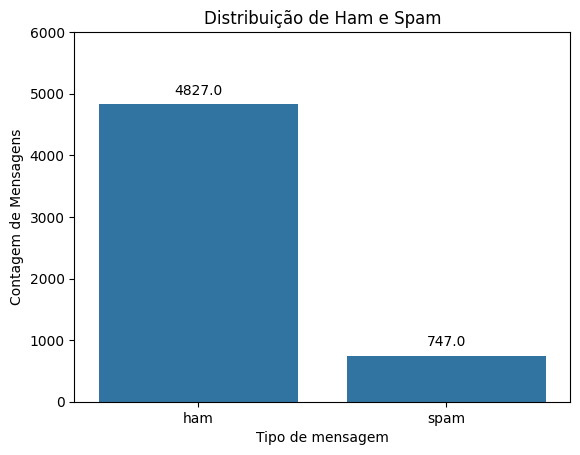

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Gráfico de barras com valores
ax = sns.countplot(x='label', data=df)
plt.title('Distribuição de Ham e Spam')
plt.ylim(0, 6000)
plt.ylabel('Contagem de Mensagens')
plt.xlabel('Tipo de mensagem')
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

In [7]:
# Remove outliers com base no IQR
Q1 = df['char_count'].quantile(0.25)
Q3 = df['char_count'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.3 * IQR
upper_bound = Q3 + 1.3 * IQR

# Filtra dados sem outliers
filtered_df = df[(df['char_count'] >= lower_bound) & (df['char_count'] <= upper_bound)]

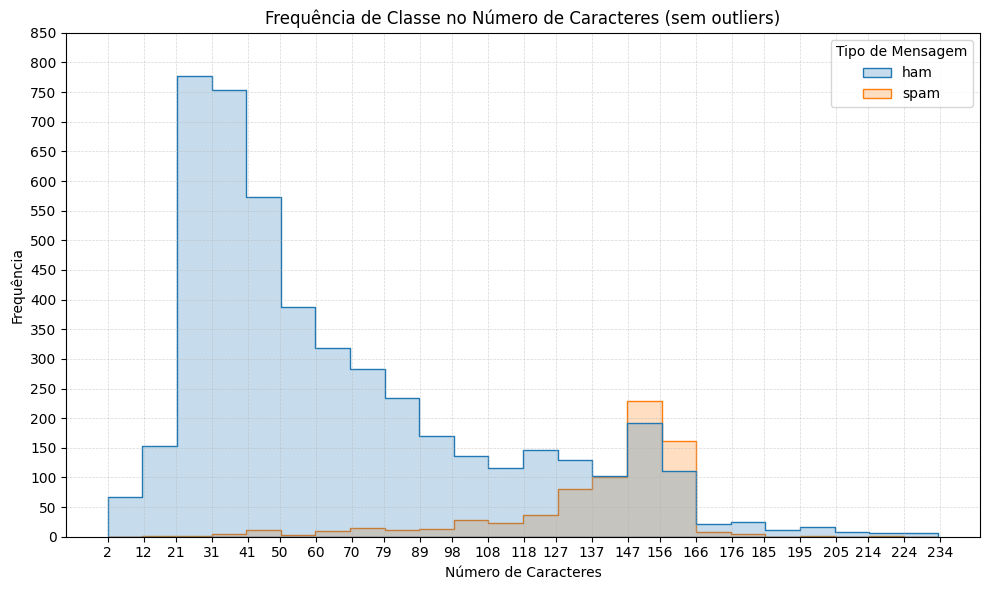


📊 Estatísticas descritivas por classe:
        count    mean    std   min    25%    50%    75%    max
label                                                         
ham    4745.0   66.52  43.73   2.0   33.0   51.0   89.0  232.0
spam    747.0  138.12  28.70  13.0  132.0  148.0  156.0  222.0

📈 Frequência por classe:
  Classe  Frequência
0    ham        4745
1   spam         747


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

data = filtered_df['char_count']
n = len(data)
min_val, max_val = data.min(), data.max()
data_range = max_val - min_val

# Scott
std = np.std(data)
scott_bin_width = 3.5 * std * n ** (-1/3)

# Geração dos limites exatos dos bins (edges)
bin_edges = np.arange(min_val, max_val + scott_bin_width, scott_bin_width)

plt.figure(figsize=(10, 6))
ax = sns.histplot(
    data=filtered_df,
    x='char_count',
    hue='label',
    element='step',
    stat='count',
    common_norm=False,
    bins=bin_edges
)
ax.legend_.set_title("Tipo de Mensagem")

plt.title('Frequência de Classe no Número de Caracteres (sem outliers)')
plt.xlabel('Número de Caracteres')
plt.ylabel('Frequência')

# Aplicação no eixo X com os mesmos limites dos bins
xtick_labels = np.round(bin_edges).astype(int)
plt.xticks(xtick_labels, rotation=0)

# Adiciona a grade tracejada
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)

# Ajusta intervalo do eixo Y
max_y = ax.get_ylim()[1]
ytick_step = 50
ax.set_yticks(np.arange(0, max_y + ytick_step, ytick_step))

plt.tight_layout()
plt.show()

# Estatísticas descritivas organizadas por label
grouped_stats = filtered_df.groupby('label')['char_count'].describe().round(2)
print("\n📊 Estatísticas descritivas por classe:")
print(grouped_stats)

# Frequência por classe
frequencia = filtered_df['label'].value_counts().rename_axis('Classe').reset_index(name='Frequência')
print("\n📈 Frequência por classe:")
print(frequencia)

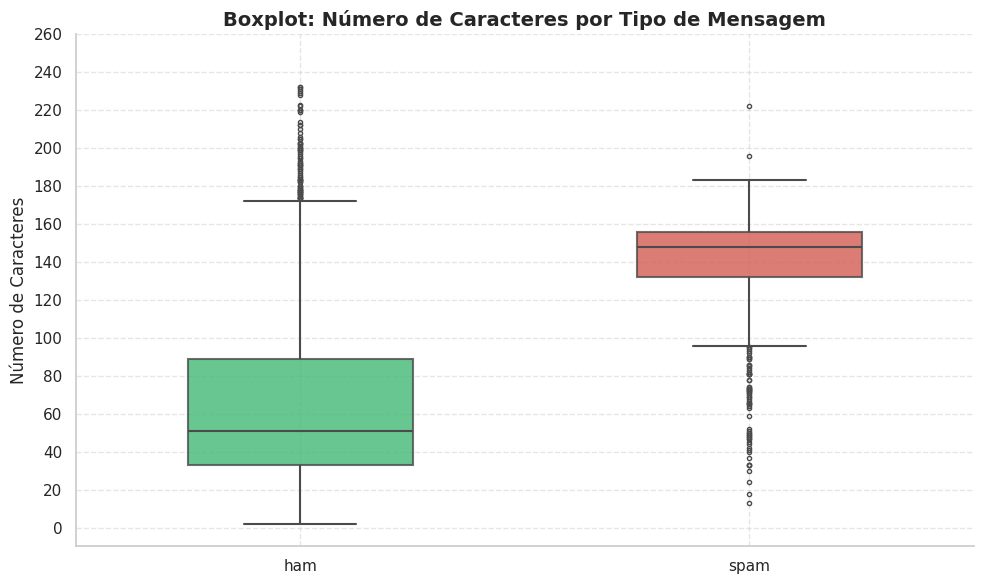

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

ax = sns.boxplot(
    x='label',
    y='char_count',
    hue='label',
    data=filtered_df,
    palette={'ham': '#2ecc71', 'spam': '#e74c3c'},
    width=0.5,
    fliersize=3,
    linewidth=1.5,
    boxprops=dict(alpha=0.8),
    legend=False
)

plt.title('Boxplot: Número de Caracteres por Tipo de Mensagem', fontsize=14, weight='bold')
plt.xlabel('')
plt.ylabel('Número de Caracteres')

# Ajusta intervalo do eixo Y
max_y = ax.get_ylim()[1]
ytick_step = 20
ax.set_yticks(np.arange(0, max_y + ytick_step, ytick_step))

# Grid e estética
ax.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()


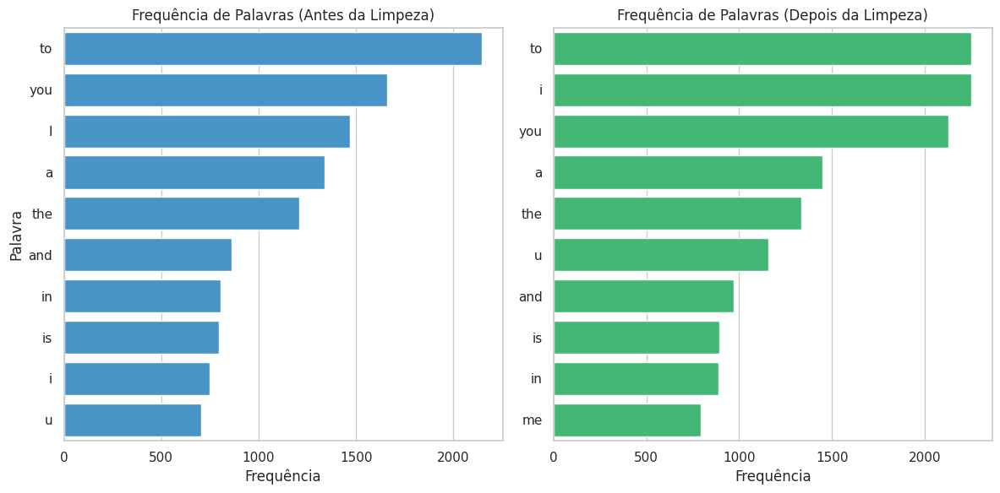

In [10]:
# Pré-processamento de Texto

# Limpar o texto: remover caracteres especiais, números e converter para minúsculas
# Tokenizar as mensagens (dividir em palavras ou termos)
# Opcional: Testar técnicas como remoção de stopwords ou stemming, mas observar se melhoram a precisão (referência: no artigo original, essas técnicas não foram usadas)

import re
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer

stemmer = PorterStemmer()

def limpar_texto(texto):
    texto = re.sub(r'[^a-zA-Z ]', '', texto)
    texto = texto.lower()
    return texto

df_clean = df.copy()
df_clean['text'] = df_clean['text'].apply(limpar_texto)

# Análise de frequência de palavras antes da limpeza
palavras_antes = ' '.join(df['text']).split()
frequencia_antes = Counter(palavras_antes)

# Análise de frequência de palavras depois da limpeza
palavras_depois = ' '.join(df_clean['text']).split()
frequencia_depois = Counter(palavras_depois)

# Extrai as 10 palavras mais frequentes
top_antes = frequencia_antes.most_common(10)
top_depois = frequencia_depois.most_common(10)

# Separa palavras e frequências
palavras_antes, contagens_antes = zip(*top_antes)
palavras_depois, contagens_depois = zip(*top_depois)

# Figura e subplots
plt.figure(figsize=(12, 6))

# Gráfico 1 - Antes da Limpeza
plt.subplot(1, 2, 1)
sns.barplot(x=contagens_antes, y=palavras_antes, color="#3498db")  # azul
plt.title('Frequência de Palavras (Antes da Limpeza)')
plt.xlabel('Frequência')
plt.ylabel('Palavra')

# Gráfico 2 - Depois da Limpeza
plt.subplot(1, 2, 2)
sns.barplot(x=contagens_depois, y=palavras_depois, color="#2ecc71")  # verde
plt.title('Frequência de Palavras (Depois da Limpeza)')
plt.xlabel('Frequência')
plt.ylabel('')

plt.tight_layout()
plt.show()

In [13]:
def remover_stopwords(tokens):
    return [token for token in tokens if token not in stop_words]

def aplicar_stemming(tokens):
    return [stemmer.stem(token) for token in tokens]

df_clean['tokens'] = df_clean['text'].apply(word_tokenize)
stop_words = set(stopwords.words('english'))
df_clean['tokens_sem_stopwords'] = df_clean['tokens'].apply(remover_stopwords)
df_clean['tokens_stemming'] = df_clean['tokens_sem_stopwords'].apply(aplicar_stemming)

display(df_clean.head())

,label,text,char_count,tokens,tokens_sem_stopwords,tokens_stemming
0,ham,go until jurong point crazy available only in bugis n great world la e buffet cine there got amore wat,110,"[go, until, jurong, point, crazy, available, only, in, bugis, n, great, world, la, e, buffet, cine, there, got, amore, wat]","[go, jurong, point, crazy, available, bugis, n, great, world, la, e, buffet, cine, got, amore, wat]","[go, jurong, point, crazi, avail, bugi, n, great, world, la, e, buffet, cine, got, amor, wat]"
1,ham,ok lar joking wif u oni,29,"[ok, lar, joking, wif, u, oni]","[ok, lar, joking, wif, u, oni]","[ok, lar, joke, wif, u, oni]"
2,spam,free entry in a wkly comp to win fa cup final tkts st may text fa to to receive entry questionstd txt ratetcs apply overs,155,"[free, entry, in, a, wkly, comp, to, win, fa, cup, final, tkts, st, may, text, fa, to, to, receive, entry, questionstd, txt, ratetcs, apply, overs]","[free, entry, wkly, comp, win, fa, cup, final, tkts, st, may, text, fa, receive, entry, questionstd, txt, ratetcs, apply, overs]","[free, entri, wkli, comp, win, fa, cup, final, tkt, st, may, text, fa, receiv, entri, questionstd, txt, ratetc, appli, over]"
3,ham,u dun say so early hor u c already then say,49,"[u, dun, say, so, early, hor, u, c, already, then, say]","[u, dun, say, early, hor, u, c, already, say]","[u, dun, say, earli, hor, u, c, alreadi, say]"
4,ham,nah i dont think he goes to usf he lives around here though,60,"[nah, i, dont, think, he, goes, to, usf, he, lives, around, here, though]","[nah, dont, think, goes, usf, lives, around, though]","[nah, dont, think, goe, usf, live, around, though]"


In [14]:
# Vetorização dos Dados

# Converter texto em features numéricas usando TF-IDF ou Bag of Words

from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df_clean['text'])
df_tfidf = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

display(df_tfidf)

aa  aah  aaniye  aaooooright  aathilove  aathiwhere   ab  abbey  \
0     0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
1     0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
2     0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
3     0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
4     0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
...   ...  ...     ...          ...        ...         ...  ...    ...   
5569  0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
5570  0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
5571  0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
5572  0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   
5573  0.0  0.0     0.0          0.0        0.0         0.0  0.0    0.0   

      abdomen  abeg  abelu  aberdeen  abi  ability  abiola  abj  able  \
0         0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
1         0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
2         0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
3         0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
4         0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
...       ...   ...    ...       ...  ...      ...     ...  ...   ...   
5569      0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
5570      0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
5571      0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
5572      0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   
5573      0.0   0.0    0.0       0.0  0.0      0.0     0.0  0.0   0.0   

      abnormally  about  aboutas  above  abroad  absence  absolutely  \
0            0.0    0.0      0.0    0.0     0.0      0.0         0.0   
1            0.0    0.0      0.0    0.0     0.0      0.0         0.0   
2            0.0    0.0      0.0    0.0     0.0      0.0         0.0   
3            0.0    0.0      0.0    0.0     0.0      0.0         0.0   
4            0.0    0.0      0.0    0.0     0.0      0.0         0.0   
...          ...    ...      ...    ...     ...      ...         ...   
5569         0.0    0.0      0.0    0.0     0.0      0.0         0.0   
5570         0.0    0.0      0.0    0.0     0.0      0.0         0.0   
5571         0.0    0.0      0.0    0.0     0.0      0.0         0.0   
5572         0.0    0.0      0.0    0.0     0.0      0.0         0.0   
5573         0.0    0.0      0.0    0.0     0.0      0.0         0.0   

      abstract  abt  abta  aburo  abuse  abusers   ac  academic  acc  accent  \
0          0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
1          0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
2          0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
3          0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
4          0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
...        ...  ...   ...    ...    ...      ...  ...       ...  ...     ...   
5569       0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
5570       0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
5571       0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
5572       0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   
5573       0.0  0.0   0.0    0.0    0.0      0.0  0.0       0.0  0.0     0.0   

      accenture  accept  access  accessible  accidant  accident  accidentally  \
0           0.0     0.0     0.0         0.0       0.0       0.0           0.0   
1           0.0     0.0     0.0         0.0       0.0       0.0           0.0   
2           0.0     0.0     0.0         0.0       0.0       0.0           0.0   
3           0.0     0.0     0.0         0.0       0.0       0.0           0.0   
4         

In [15]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df_clean['text'])
df_bow = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

display(df_bow)

aa  aah  aaniye  aaooooright  aathilove  aathiwhere  ab  abbey  abdomen  \
0      0    0       0            0          0           0   0      0        0   
1      0    0       0            0          0           0   0      0        0   
2      0    0       0            0          0           0   0      0        0   
3      0    0       0            0          0           0   0      0        0   
4      0    0       0            0          0           0   0      0        0   
...   ..  ...     ...          ...        ...         ...  ..    ...      ...   
5569   0    0       0            0          0           0   0      0        0   
5570   0    0       0            0          0           0   0      0        0   
5571   0    0       0            0          0           0   0      0        0   
5572   0    0       0            0          0           0   0      0        0   
5573   0    0       0            0          0           0   0      0        0   

      abeg  abelu  aberdeen  abi  ability  abiola  abj  able  abnormally  \
0        0      0         0    0        0       0    0     0           0   
1        0      0         0    0        0       0    0     0           0   
2        0      0         0    0        0       0    0     0           0   
3        0      0         0    0        0       0    0     0           0   
4        0      0         0    0        0       0    0     0           0   
...    ...    ...       ...  ...      ...     ...  ...   ...         ...   
5569     0      0         0    0        0       0    0     0           0   
5570     0      0         0    0        0       0    0     0           0   
5571     0      0         0    0        0       0    0     0           0   
5572     0      0         0    0        0       0    0     0           0   
5573     0      0         0    0        0       0    0     0           0   

      about  aboutas  above  abroad  absence  absolutely  abstract  abt  abta  \
0         0        0      0       0        0           0         0    0     0   
1         0        0      0       0        0           0         0    0     0   
2         0        0      0       0        0           0         0    0     0   
3         0        0      0       0        0           0         0    0     0   
4         0        0      0       0        0           0         0    0     0   
...     ...      ...    ...     ...      ...         ...       ...  ...   ...   
5569      0        0      0       0        0           0         0    0     0   
5570      0        0      0       0        0           0         0    0     0   
5571      0        0      0       0        0           0         0    0     0   
5572      0        0      0       0        0           0         0    0     0   
5573      0        0      0       0        0           0         0    0     0   

      aburo  abuse  abusers  ac  academic  acc  accent  accenture  accept  \
0         0      0        0   0         0    0       0          0       0   
1         0      0        0   0         0    0       0          0       0   
2         0      0        0   0         0    0       0          0       0   
3         0      0        0   0         0    0       0          0       0   
4         0      0        0   0         0    0       0          0       0   
...     ...    ...      ...  ..       ...  ...     ...        ...     ...   
5569      0      0        0   0         0    0       0          0       0   
5570      0      0        0   0         0    0       0          0       0   
5571      0      0        0   0         0    0       0          0       0   
5572      0      0        0   0         0    0       0          0       0   
5573      0      0        0   0         0    0       0          0       0   

      access  accessible  accidant  accident  accidentally  accommodation  \
0          0           0         0         0             0              0   
1          0           0         0         0             0          

In [16]:
# Divisão dos Dados

# Separar o dataset em conjuntos de treino (70%) e teste (30%)
# Considerar técnicas para balanceamento de classes (ex: SMOTE para oversampling)

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

# Separa os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(df_tfidf, df_clean['label'], test_size=0.3, random_state=42)

# Balanceamento de classes com SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

print("Tamanho do conjunto de treino original:", len(X_train))
print("Tamanho do conjunto de treino após SMOTE:", len(X_train_resampled))
print("Tamanho do conjunto de teste:", len(X_test))

Tamanho do conjunto de treino original: 3901
Tamanho do conjunto de treino após SMOTE: 6760
Tamanho do conjunto de teste: 1673


In [17]:
# Treinamento de Modelos

# Testar algoritmos como:
# SVM Linear (destaque no artigo original)
# Naive Bayes Multinomial (comum em NLP)
# Random Forest ou Regressão Logística

from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

models = {
    'SVM Linear': LinearSVC(random_state=42),
    'Naive Bayes Multinomial': MultinomialNB(),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Regressão Logística': LogisticRegression(random_state=42)
}

In [18]:
# Avaliação dos Modelos

# Calcular métricas: Acurácia, Precisão, Recall, F1-Score e Matriz de Confusão
# Justificar a escolha da métrica principal (ex: F1-Score é adequado para dados desbalanceados)

from collections import Counter
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

for model_name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test)

    print(f"\n{model_name}:")
    print("Acurácia:", accuracy_score(y_test, y_pred))
    print("Precisão:", precision_score(y_test, y_pred, pos_label='spam'))
    print("Recall:", recall_score(y_test, y_pred, pos_label='spam'))
    print("F1-Score:", f1_score(y_test, y_pred, pos_label='spam'))
    print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))


SVM Linear:
Acurácia: 0.9802749551703527
Precisão: 0.9530516431924883
Recall: 0.8982300884955752
F1-Score: 0.9248291571753986
Matriz de Confusão:
 [[1437   10]
 [  23  203]]

Naive Bayes Multinomial:
Acurácia: 0.968320382546324
Precisão: 0.8473895582329317
Recall: 0.9336283185840708
F1-Score: 0.888421052631579
Matriz de Confusão:
 [[1409   38]
 [  15  211]]

Random Forest:
Acurácia: 0.9736999402271369
Precisão: 1.0
Recall: 0.8053097345132744
F1-Score: 0.8921568627450981
Matriz de Confusão:
 [[1447    0]
 [  44  182]]

Regressão Logística:
Acurácia: 0.9736999402271369
Precisão: 0.9136363636363637
Recall: 0.8893805309734514
F1-Score: 0.9013452914798207
Matriz de Confusão:
 [[1428   19]
 [  25  201]]



SVM Linear:
Acurácia: 0.9802749551703527
Precisão: 0.9530516431924883
Recall: 0.8982300884955752
F1-Score: 0.9248291571753986


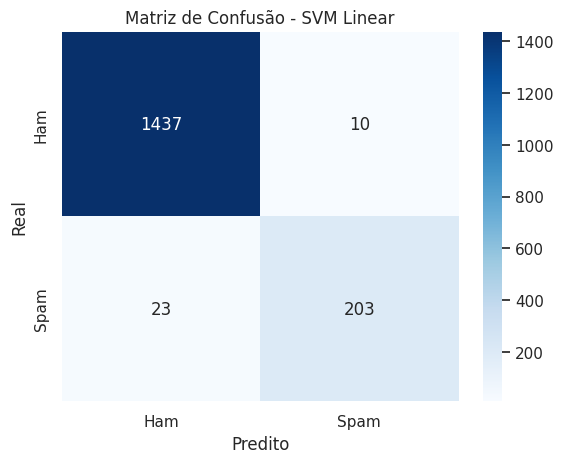


Naive Bayes Multinomial:
Acurácia: 0.968320382546324
Precisão: 0.8473895582329317
Recall: 0.9336283185840708
F1-Score: 0.888421052631579


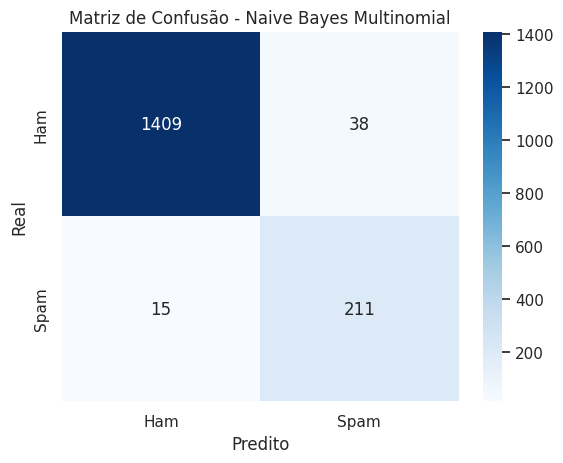


Random Forest:
Acurácia: 0.9736999402271369
Precisão: 1.0
Recall: 0.8053097345132744
F1-Score: 0.8921568627450981


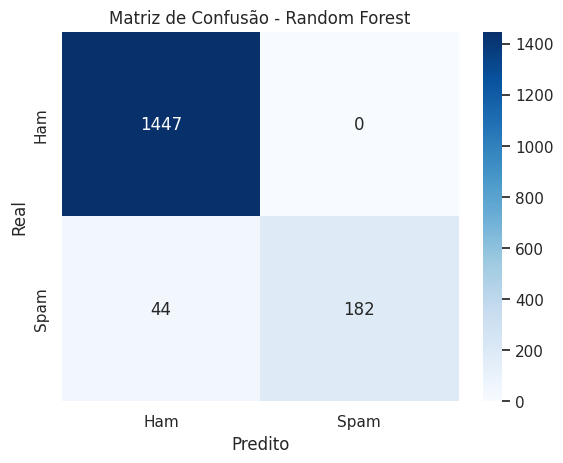


Regressão Logística:
Acurácia: 0.9736999402271369
Precisão: 0.9136363636363637
Recall: 0.8893805309734514
F1-Score: 0.9013452914798207


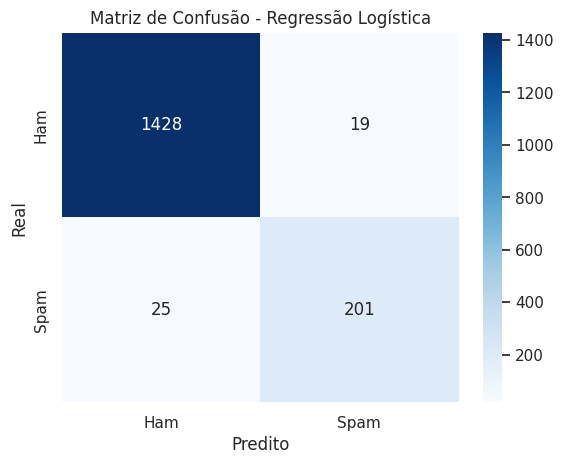

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import ConfusionMatrixDisplay

for model_name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test)

    print(f"\n{model_name}:")
    print("Acurácia:", accuracy_score(y_test, y_pred))
    print("Precisão:", precision_score(y_test, y_pred, pos_label='spam'))
    print("Recall:", recall_score(y_test, y_pred, pos_label='spam'))
    print("F1-Score:", f1_score(y_test, y_pred, pos_label='spam'))

    cm = confusion_matrix(y_test, y_pred, labels=["ham", "spam"])
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Ham", "Spam"], yticklabels=["Ham", "Spam"])
    plt.title(f"Matriz de Confusão - {model_name}")
    plt.xlabel("Predito")
    plt.ylabel("Real")
    plt.show()

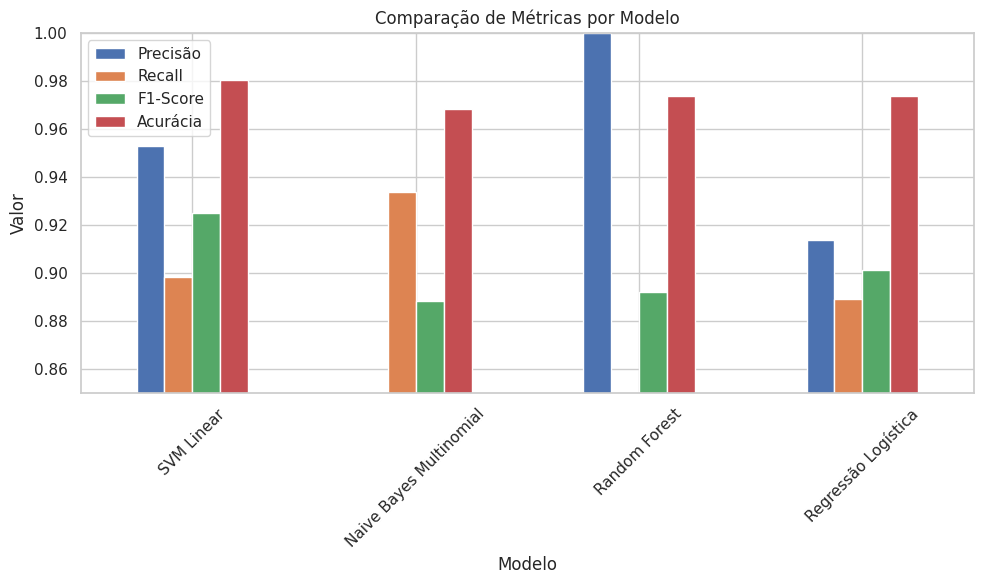

In [20]:
import pandas as pd

results = []

for model_name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test)

    results.append({
        "Modelo": model_name,
        "Precisão": precision_score(y_test, y_pred, pos_label='spam'),
        "Recall": recall_score(y_test, y_pred, pos_label='spam'),
        "F1-Score": f1_score(y_test, y_pred, pos_label='spam'),
        "Acurácia": accuracy_score(y_test, y_pred)
    })

df_results = pd.DataFrame(results)
df_results.set_index("Modelo")[["Precisão", "Recall", "F1-Score", "Acurácia"]].plot(kind='bar', figsize=(10,6))
plt.title("Comparação de Métricas por Modelo")
plt.ylabel("Valor")
plt.xticks(rotation=45)
plt.ylim(0.85, 1.0)
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

In [21]:
# Otimização

# Ajustar hiperparâmetros com GridSearchCV ou RandomizedSearchCV
# Comparar o desempenho antes e após a otimização

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import f1_score, make_scorer

# Define os hiperparâmetros a serem testados para cada modelo
param_grid_svm = {'C': [0.1, 1, 10]}
param_grid_nb = {'alpha': [0.1, 1, 10]}
param_grid_rf = {'n_estimators': [100, 200, 300], 'max_depth': [None, 5, 10]}
param_grid_lr = {'C': [0.1, 1, 10]}

# Cria um scorer F1 com pos_label='spam'
f1_scorer = make_scorer(f1_score, pos_label='spam')

# Cria os objetos GridSearchCV ou RandomizedSearchCV para cada modelo, usando o scorer personalizado
grid_svm = GridSearchCV(LinearSVC(random_state=42), param_grid_svm, cv=5, scoring=f1_scorer)
grid_nb = GridSearchCV(MultinomialNB(), param_grid_nb, cv=5, scoring=f1_scorer)
grid_rf = RandomizedSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, n_iter=10, cv=5, scoring=f1_scorer, random_state=42)
grid_lr = GridSearchCV(LogisticRegression(random_state=42), param_grid_lr, cv=5, scoring=f1_scorer)

# Ajusta os modelos com os dados de treino (ou os dados balanceados com SMOTE)
grid_svm.fit(X_train_resampled, y_train_resampled)
grid_nb.fit(X_train_resampled, y_train_resampled)
grid_rf.fit(X_train_resampled, y_train_resampled)
grid_lr.fit(X_train_resampled, y_train_resampled)

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=42),
             param_grid={'C': [0.1, 1, 10]},
             scoring=make_scorer(f1_score, response_method='predict', pos_label=spam))

In [22]:
# Imprime os melhores hiperparâmetros e o desempenho para cada modelo
print("SVM Linear - Melhores hiperparâmetros:", grid_svm.best_params_)
print("SVM Linear - Melhor F1-Score:", grid_svm.best_score_)

print("\nNaive Bayes Multinomial - Melhores hiperparâmetros:", grid_nb.best_params_)
print("Naive Bayes Multinomial - Melhor F1-Score:", grid_nb.best_score_)

print("\nRandom Forest - Melhores hiperparâmetros:", grid_rf.best_params_)
print("Random Forest - Melhor F1-Score:", grid_rf.best_score_)

print("\nRegressão Logística - Melhores hiperparâmetros:", grid_lr.best_params_)
print("Regressão Logística - Melhor F1-Score:", grid_lr.best_score_)

SVM Linear - Melhores hiperparâmetros: {'C': 10}
SVM Linear - Melhor F1-Score: 0.9988176610650219

Naive Bayes Multinomial - Melhores hiperparâmetros: {'alpha': 0.1}
Naive Bayes Multinomial - Melhor F1-Score: 0.9917640179360948

Random Forest - Melhores hiperparâmetros: {'n_estimators': 100, 'max_depth': None}
Random Forest - Melhor F1-Score: 0.9908739365815933

Regressão Logística - Melhores hiperparâmetros: {'C': 10}
Regressão Logística - Melhor F1-Score: 0.9962866301085331


In [23]:
models = {
    'SVM Linear': LinearSVC(random_state=42),
    'Naive Bayes Multinomial': MultinomialNB(),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Regressão Logística': LogisticRegression(random_state=42)
}

grids = {
    'SVM Linear': grid_svm,
    'Naive Bayes Multinomial': grid_nb,
    'Random Forest': grid_rf,
    'Regressão Logística': grid_lr
}

# Avaliação dos modelos padrão vs otimizados
for model_name in models:
    model = models[model_name]
    grid = grids[model_name]

    # Modelo padrão (sem otimização)
    model.fit(X_train, y_train)
    y_pred_padrao = model.predict(X_test)
    f1_padrao = f1_score(y_test, y_pred_padrao, pos_label='spam')

    # Modelo otimizado com GridSearchCV
    y_pred_otimizado = grid.predict(X_test)
    f1_otimizado = f1_score(y_test, y_pred_otimizado, pos_label='spam')

    print(f"\n{model_name}")
    print(f"- F1-Score padrão: {f1_padrao:.4f}")
    print(f"- F1-Score otimizado: {f1_otimizado:.4f}")
    print(f"- Melhora: {(f1_otimizado - f1_padrao) / f1_padrao:.2%}")


SVM Linear
- F1-Score padrão: 0.9299
- F1-Score otimizado: 0.9302
- Melhora: 0.04%

Naive Bayes Multinomial
- F1-Score padrão: 0.7914
- F1-Score otimizado: 0.9170
- Melhora: 15.87%

Random Forest
- F1-Score padrão: 0.8840
- F1-Score otimizado: 0.8922
- Melhora: 0.93%

Regressão Logística
- F1-Score padrão: 0.8367
- F1-Score otimizado: 0.9227
- Melhora: 10.28%



# Conclusão e Recomendações

## Indicação do Melhor Modelo com Base nas Métricas

Com base nos resultados da avaliação dos modelos, podemos observar que todos os modelos testados apresentaram um bom desempenho na classificação de mensagens SMS como **spam** ou **ham**, com destaque para o modelo **SVM Linear** com o **F1-Score otimizado de 0.9302**, que apresentou a melhor performance dentre os modelos testados.

Os resultados dos outros modelos foram os seguintes:

- **Naive Bayes Multinomial**: F1-Score otimizado de 0.9170, apresentando um desempenho ligeiramente inferior ao do SVM Linear.
- **Random Forest**: F1-Score otimizado de 0.8922, o que indica um resultado inferior.
- **Regressão Logística**: F1-Score de 0.9227.

Considerando o **F1-Score** como a métrica principal, devido ao desbalanceamento do dataset, o **SVM Linear otimizado** é o modelo mais indicado para a tarefa de classificação de spam, pois apresentou o maior valor para essa métrica, o que significa um bom equilíbrio entre **precisão** e **recall** na detecção de mensagens **spam**.

## Sugestões para Melhorias Futuras

Apesar do bom desempenho obtido, algumas melhorias podem ser exploradas para aprimorar ainda mais o modelo:

### 1. Utilizar **N-grams**
Em vez de considerar apenas palavras individuais, podemos utilizar **n-grams** (sequências de n palavras) como features. Isso pode capturar informações contextuais importantes e melhorar a precisão do modelo. Testar diferentes valores de n (bigramas, trigramas, etc.) e avaliar o impacto na performance pode ser uma estratégia eficaz.

### 2. Incorporar **Embeddings de Palavras**
**Embeddings de palavras** são representações vetoriais de palavras que capturam relações semânticas entre elas. Ao incorporar embeddings pré-treinados (como **Word2Vec**, **GloVe** ou **FastText**) ou treinar seus próprios embeddings com o dataset, podemos enriquecer a representação das mensagens e potencialmente melhorar a performance do modelo.

### 3. Testar **Outros Algoritmos**
Explorar outros algoritmos de classificação, como **Redes Neurais**, e comparar seus resultados com os modelos já testados. Isso pode levar à descoberta de um modelo ainda mais eficaz para a tarefa.

### 4. Ajustar o **Pré-processamento**
Diferentes técnicas de **pré-processamento**, como a remoção de **stopwords**, **stemming** ou **lemmatization**, para verificar se elas impactam positivamente a performance do modelo.

### 5. Realizar uma **Análise Mais Profunda dos Erros**
Analisar as mensagens que foram classificadas incorretamente pelo modelo para identificar padrões e entender os motivos dos erros. Essa análise pode fornecer insights valiosos para melhorar o modelo e torná-lo mais robusto.

### 6. Referência ao **Dataset** e ao **Artigo Original**
Este estudo utilizou o SMS Spam Collection, um corpus de mensagens SMS rotuladas como "spam" ou "ham", originalmente disponibilizado por Tiago Almeida e Jos Hidalgo. O dataset está disponível publicamente no repositório da UCI Machine Learning Repository.

Você pode acessar o dataset diretamente no [UCI Archive](https://archive.ics.uci.edu/dataset/228/sms+spam+collection).

---

